# Assignment 3 - Image Segmentation using MRFs

## GrabCut

---
**TA** : Rohan, Prajwal  
**Release date**: 05/03/21  
**Submission date** : 16/03/21

---

For this assignment you will implement the GrabCut method mentioned in this [paper](https://cvg.ethz.ch/teaching/cvl/2012/grabcut-siggraph04.pdf). It is essentially an iterative version of GraphCut as shown in the figure below. 
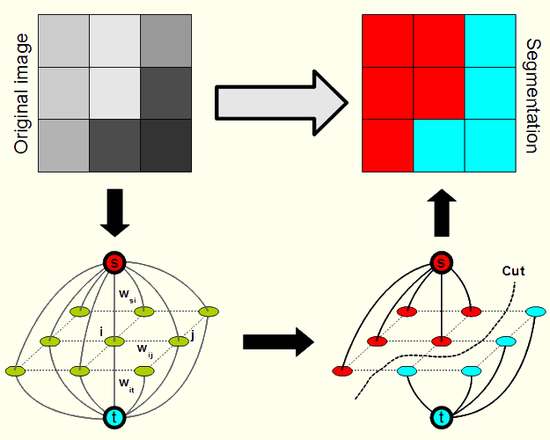

The code below takes an input image and follows these steps:
- It requires a bounding box to be drawn by the user to roughly segment out the foreground pixels
- It runs an initial min-cut optimization using the provided annotation
- The result of this optimization gives an initial segmentation 
- To further refine this segmentation, the user provides two kinds of strokes to aid the optimization
    - strokes on the background pixels
    - strokes on the foreground pixels
- The algorithm now utilizes this to refine the original segmentation

You are allowed to use standard GMM libraries for the implementation. For usage of other libraries, please contact the TAs.

You can view this [video](https://www.youtube.com/watch?v=aOqOwM-Qbtg) to get a better idea of the steps involved.

Image segmentation is one exciting application of MRFs. You can further read about other applications of MRFs for Computer Vision [here](https://cedar.buffalo.edu/~srihari/CSE574/Chap8/Ch8-PGM-Undirected/9.5-MRFinCV.pdf).

#### Useful Links
* https://courses.engr.illinois.edu/cs543/sp2011/lectures/Lecture%2012%20-%20MRFs%20and%20Graph%20Cut%20Segmentation%20-%20Vision_Spring2011.pdf

In [1]:
import numpy as np
import cv2
import numpy as np
from sklearn.cluster import KMeans
import networkx as nx
from sklearn import mixture
from networkx.algorithms.flow import shortest_augmenting_path
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
class EventHandler:
    """
    Class for handling user input during segmentation iterations 
    """
    
    def __init__(self, flags, img, _mask, colors):
        
        self.FLAGS = flags
        self.ix = -1
        self.iy = -1
        self.img = img
        self.img2 = self.img.copy()
        self._mask = _mask
        self.COLORS = colors

    @property
    def image(self):
        return self.img
    
    @image.setter
    def image(self, img):
        self.img = img
        
    @property
    def mask(self):
        return self._mask
    
    @mask.setter
    def mask(self, _mask):
        self._mask = _mask
    
    @property
    def flags(self):
        return self.FLAGS 
    
    @flags.setter
    def flags(self, flags):
        self.FLAGS = flags
    
    def handler(self, event, x, y, flags, param):

        # Draw the rectangle first
        if event == cv2.EVENT_RBUTTONDOWN:
            self.FLAGS['DRAW_RECT'] = True
            self.ix, self.iy = x,y

        elif event == cv2.EVENT_MOUSEMOVE:
            if self.FLAGS['DRAW_RECT'] == True:
                self.img = self.img2.copy()
                cv2.rectangle(self.img, (self.ix, self.iy), (x, y), self.COLORS['BLUE'], 2)
                self.FLAGS['RECT'] = (min(self.ix, x), min(self.iy, y), abs(self.ix - x), abs(self.iy - y))
                self.FLAGS['rect_or_mask'] = 0

        elif event == cv2.EVENT_RBUTTONUP:
            self.FLAGS['DRAW_RECT'] = False
            self.FLAGS['rect_over'] = True
            cv2.rectangle(self.img, (self.ix, self.iy), (x, y), self.COLORS['BLUE'], 2)
            self.FLAGS['RECT'] = (min(self.ix, x), min(self.iy, y), abs(self.ix - x), abs(self.iy - y))
            self.FLAGS['rect_or_mask'] = 0

        
        # Draw strokes for refinement 

        if event == cv2.EVENT_LBUTTONDOWN:
            if self.FLAGS['rect_over'] == False:
                print('Draw the rectangle first.')
            else:
                self.FLAGS['DRAW_STROKE'] = True
                cv2.circle(self.img, (x,y), 3, self.FLAGS['value']['color'], -1)
                cv2.circle(self._mask, (x,y), 3, self.FLAGS['value']['val'], -1)

        elif event == cv2.EVENT_MOUSEMOVE:
            if self.FLAGS['DRAW_STROKE'] == True:
                cv2.circle(self.img, (x, y), 3, self.FLAGS['value']['color'], -1)
                cv2.circle(self._mask, (x, y), 3, self.FLAGS['value']['val'], -1)

        elif event == cv2.EVENT_LBUTTONUP:
            if self.FLAGS['DRAW_STROKE'] == True:
                self.FLAGS['DRAW_STROKE'] = False
                cv2.circle(self.img, (x, y), 3, self.FLAGS['value']['color'], -1)
                cv2.circle(self._mask, (x, y), 3, self.FLAGS['value']['val'], -1)

In [3]:
def run(filename: str,ITR):
    """
    Main loop that implements GrabCut. 
    
    Input
    -----
    filename (str) : Path to image
    """
    
    COLORS = {
    'BLACK' : [0,0,0],
    'RED'   : [0, 0, 255],
    'GREEN' : [0, 255, 0],
    'BLUE'  : [255, 0, 0],
    'WHITE' : [255,255,255]
    }

    DRAW_BG = {'color' : COLORS['BLACK'], 'val' : 0}
    DRAW_FG = {'color' : COLORS['WHITE'], 'val' : 1}

    FLAGS = {
        'RECT' : (0, 0, 1, 1),
        'DRAW_STROKE': False,         # flag for drawing strokes
        'DRAW_RECT' : False,          # flag for drawing rectangle
        'rect_over' : False,          # flag to check if rectangle is  drawn
        'rect_or_mask' : -1,          # flag for selecting rectangle or stroke mode
        'value' : DRAW_FG,            # drawing strokes initialized to mark foreground
    }

    img = cv2.imread(filename)
    img2 = img.copy()                                
    mask = np.zeros(img.shape[:2], dtype = np.uint8) # mask is a binary array with : 0 - background pixels
                                                     #                               1 - foreground pixels 
    output = np.zeros(img.shape, np.uint8)           # output image to be shown

    # Input and segmentation windows
    cv2.namedWindow('Input Image')
    cv2.namedWindow('Segmented output')
    
    EventObj = EventHandler(FLAGS, img, mask, COLORS)
    cv2.setMouseCallback('Input Image', EventObj.handler)
    cv2.moveWindow('Input Image', img.shape[1] + 10, 90)

    while(1):
        
        img = EventObj.image
        mask = EventObj.mask
        FLAGS = EventObj.flags
        cv2.imshow('Segmented image', output)
        cv2.imshow('Input Image', img)
        
        k = cv2.waitKey(1)

        # key bindings
        if k == 27:
            # esc to exit
            break
        
        elif k == ord('0'): 
            # Strokes for background
            FLAGS['value'] = DRAW_BG
        
        elif k == ord('1'):
            # FG drawing
            FLAGS['value'] = DRAW_FG
        
        elif k == ord('r'):
            # reset everything
            FLAGS['RECT'] = (0, 0, 1, 1)
            FLAGS['DRAW_STROKE'] = False
            FLAGS['DRAW_RECT'] = False
            FLAGS['rect_or_mask'] = -1
            FLAGS['rect_over'] = False
            FLAGS['value'] = DRAW_FG
            img = img2.copy()
            mask = np.zeros(img.shape[:2], dtype = np.uint8) 
            EventObj.image = img
            EventObj.mask = mask
            output = np.zeros(img.shape, np.uint8)
        
        elif k == 13: 
            # Press carriage return to initiate segmentation
            
            #-------------------------------------------------#
            # Implement GrabCut here.                         #  
            # Function should return a mask which can be used #
            # to segment the original image as shown on L90   # 
            #-------------------------------------------------#

            #GrabCut(img2, mask, EventObj) 
            gcut=GrabCut()
            gcut.process(img2, mask, EventObj,filename,ITR)
        EventObj.flags = FLAGS
        mask2 = np.where((mask == 1), 255, 0).astype('uint8')
        output = cv2.bitwise_and(img2, img2, mask = mask2)

In [23]:
from sklearn import mixture
from networkx.algorithms.flow import shortest_augmenting_path
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline
class GrabCut:
    gamma = 100
    component = 5
    bacgroundgGMM=None
    foregroundGMM=None
    four_neighbourhood = True
    def calculateMask(self,image, roiOfImage):
        print("in calculateMask...")
        ch1=image.shape[0]
        ch2=image.shape[1]
        masks = np.zeros((ch1, ch2))
        #i=0
       # while i < ch1:
        for i in range(ch1):
            for j in range(ch2):
                if j >= roiOfImage[0] and j <= roiOfImage[2] and i >= roiOfImage[1] and i <= roiOfImage[3]:
                    masks[i][j] = 1
                else:
                    masks[i][j] = 0
        print("Exiting calculateMask...")                
        return masks

    def calcGaussian(self,D, k):
        clf = mixture.GaussianMixture(n_components = k, covariance_type='full')
        clf.fit(D)
        return clf

    def initializeGaussian(self,img, masks):
        fgr = []
        bgr = []
        ch1=img.shape[0]
        ch2=img.shape[1]
        for i in range(ch1):
            for j in range(ch2):
                if masks[i][j] == 1:
                    fgr.append(img[i][j])
                else:
                    bgr.append(img[i][j])
        self.bacgroundgGMM = self.calcGaussian(bgr, self.component)
        self.foregroundGMM = self.calcGaussian(fgr, self.component)
        return self.foregroundGMM, self.bacgroundgGMM

    def nlikelihood(self,d, clff):
        index = clff.predict(d.reshape(1, -1))[0]
        per=0.5 
        cvr = per * np.log(np.linalg.det(clff.covariances_[index]))
        varr = per * np.dot(np.dot(np.transpose(d - clff.means_[index]), np.linalg.inv(clff.covariances_[index])), d - clff.means_[index])
        lwt = -np.log(clff.weights_[index])
        return (cvr + varr + lwt)

    def cost(self,image, clff):
        ch1=image.shape[0]
        ch2=image.shape[1]
        pnlty = np.zeros((ch1,ch2))
        for i in range(ch1):
            for j in range(ch2):
                pnlty[i][j] = self.nlikelihood(image[i][j], clff)
        return pnlty

    def getPotential(self,a, b, beta):
        return self.gamma * np.exp(-1.0 * beta * np.sum((a - b) ** 2))

    def graphCreation(self,image, foreGroundPen, backGroundPen, mask):
        bt = 0.0
        counter = 0
        graph = nx.Graph()
        graph.add_node('s')
        graph.add_node('t')
        ch1=image.shape[0]
        ch2=image.shape[1]
        for index in range(ch1):
            for j in range(ch2):
                graph.add_node((index, j))
                for k in range(-1, 2):
                    for l in range(-1, 2):
                        if abs(k) + abs(l) == 0 or (abs(k) + abs(l) > 1 and self.four_neighbourhood == True):
                            continue
                        if (index + k) < 0 or (index + k) >= image.shape[0] or (j + l) < 0 or (j + l) >= image.shape[1]:
                            continue
                        bt = bt + np.sum((image[index][j] - image[index + k][j + l])** 2)
                        counter = counter + 1
        bt = (bt * 0.5) / counter
        infinite = 99999999999999999999999999999999999
        for index in range(image.shape[0]):
            for j in range(image.shape[1]):
                if mask[index][j] == 0:
                    graph.add_edge('s', (index, j), capacity = 0)
                    graph.add_edge((index, j), 't', capacity = infinite)
                else:
                    graph.add_edge('s', (index, j), capacity = backGroundPen[index][j])
                    graph.add_edge((index, j), 't', capacity = foreGroundPen[index][j])
                for k in range(-1, 2):
                    for l in range(-1, 2):
                        if abs(k) + abs(l) == 0 or (abs(k) + abs(l) > 1 and self.four_neighbourhood == True):
                            continue
                        if (index + k) < 0 or (index + k) >= image.shape[0] or (j + l) < 0 or (j + l) >= image.shape[1]:
                            continue
                        # Need to add pairwise edges
                        graph.add_edge((index, j), (index + k, j + l), capacity = self.getPotential(image[index][j], image[index + k][j + l], bt))
        return graph
   
    def display_images(self,images, rows, cols, size, title, subtitles):
    
        fig = plt.figure(figsize = size)
        c = 0
        sz = len(images)
        for i in range(rows):
            for j in range(cols):
                if sz == c:
                    break
                ax1 = fig.add_subplot(rows, cols, c + 1)
                ax1.imshow(images[c], cmap = 'gray')
                ax1.set_title(subtitles[c], fontsize = 20)
                c = c + 1
        plt.show()   
    
    def process(self,image, mask, EventObj,filename,ITR):
        print("in grabcut...")
        FLAGS = EventObj.flags
        '''
        plt.subplot(2,2,1)
        plt.imshow(image)
        plt.xticks([]), plt.yticks([])
        '''
        subtitles = []
        imageList=[]
        b,g,r = cv2.split(image)       # get b,g,r
        rgb_img = cv2.merge([r,g,b])     # switch it to rgb
        imageList.append(image)
        subtitles.append('Original')

        image = np.asarray(image, dtype=np.float64)
        rectn= FLAGS['RECT']
        roiOfImage = [rectn[0], rectn[1], rectn[2]+rectn[0], rectn[3]+rectn[1]]
        print(roiOfImage)
        masks = self.calculateMask(image, roiOfImage)
        for x in range(ITR):
            self.fogr_GMM, self.bogr_GMM = self.initializeGaussian(image, masks)

            fogr_penal = self.cost(image, self.fogr_GMM)
            bogr_penal= self.cost(image, self.bogr_GMM)
            G = self.graphCreation(image, fogr_penal, bogr_penal, masks)
            cut_value, partition = nx.minimum_cut(G, 's', 't', flow_func=shortest_augmenting_path)
            reachable, non_reachable = partition
            masks = np.zeros((image.shape[0], image.shape[1]))
            for pixel in reachable:
                if pixel != 's':
                    p1=pixel[0]
                    p2=pixel[1]
                    masks[p1][p2] = 1
            roi_image = np.zeros(image.shape)
            ch1=image.shape[0]
            ch2=image.shape[1]
            for i in range(ch1):
                for j in range(ch2):
                    if masks[i][j] == 1:
                        roi_image[i][j] = image[i][j]
            roi_image = roi_image.astype(np.uint8)
            
            fname=filename.split('/')
            b,g,r = cv2.split(roi_image)       # get b,g,r
            rgb_img = cv2.merge([r,g,b])     # switch it to rgb
            imageList.append(rgb_img)
            subtitles.append(str(x) +' iteration')
            #plt.imshow(image)
            cv2.imwrite("../images/result/" +str(x)+fname[2],roi_image)#saving grey scaleimage
        print("value of gamma : ",self.gamma)
        self.display_images(imageList, 5, 2, (50, 50), '', subtitles)
        cv2.imshow('Segmented image', roi_image)
        cv2.waitKey()

        print('exiting grabcut...') 

in grabcut...
[20, 19, 405, 421]
in calculateMask...
Exiting calculateMask...
value of gamma :  100


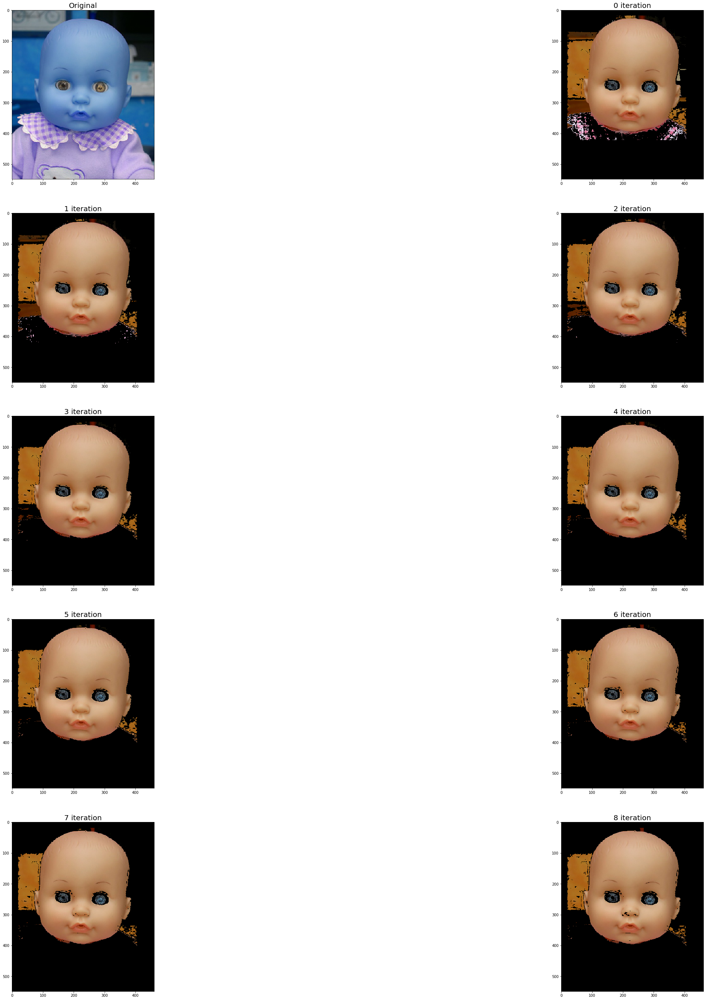

exiting grabcut...


In [24]:
if __name__ == '__main__':
    filename = '../images/doll.jpg'               # Path to image file
    ITR=10
    run(filename,ITR)
    cv2.destroyAllWindows()

In [87]:
if __name__ == '__main__':
    filename = '../images/teddy.jpg'               # Path to image file
    ITR=6
    run(filename,ITR)
    cv2.destroyAllWindows()

Draw the rectangle first.


in grabcut...
[22, 27, 534, 439]
in calculateMask...
Exiting calculateMask...


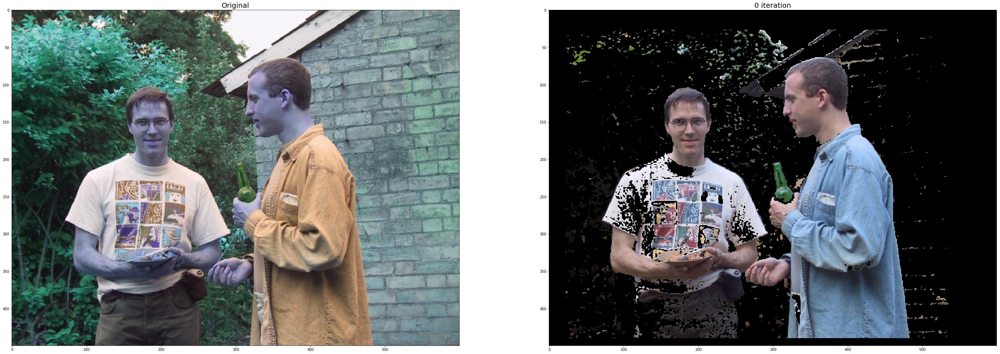

exiting grabcut...


In [93]:
#testing gmm=1
if __name__ == '__main__':
    filename = '../images/person4.jpg'               # Path to image file
    ITR=1
    run(filename,ITR)
    cv2.destroyAllWindows()

in grabcut...
[38, 23, 497, 407]
in calculateMask...
Exiting calculateMask...
value of gmm :  3


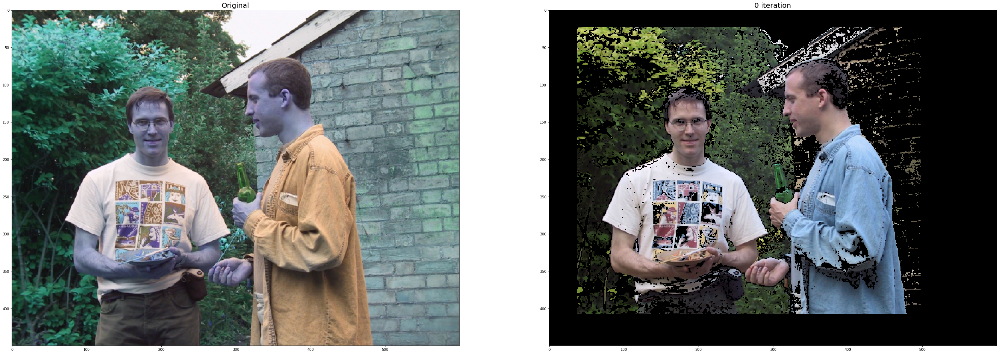

exiting grabcut...


In [104]:
#GMM=3
if __name__ == '__main__':
    filename = '../images/person4.jpg'               # Path to image file
    ITR=1
    run(filename,ITR)
    cv2.destroyAllWindows()

in grabcut...
[54, 33, 484, 435]
in calculateMask...
Exiting calculateMask...
value of gmm :  5


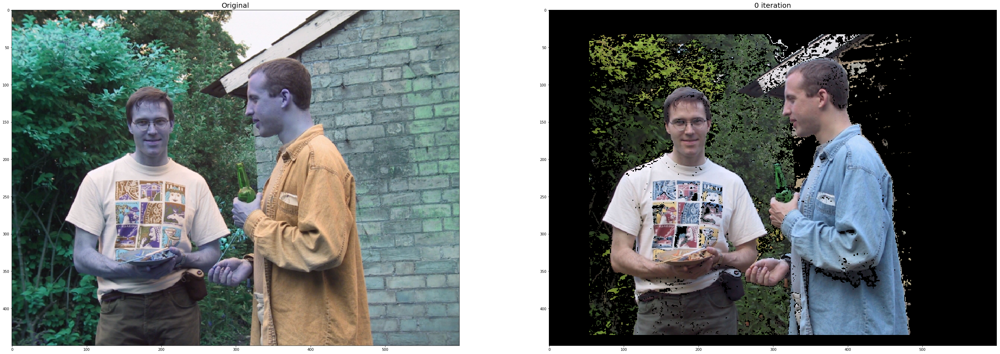

exiting grabcut...


In [108]:
#GMM=5
if __name__ == '__main__':
    filename = '../images/person4.jpg'               # Path to image file
    ITR=1
    run(filename,ITR)
    cv2.destroyAllWindows()

in grabcut...
[60, 19, 526, 442]
in calculateMask...
Exiting calculateMask...
value of gmm :  5


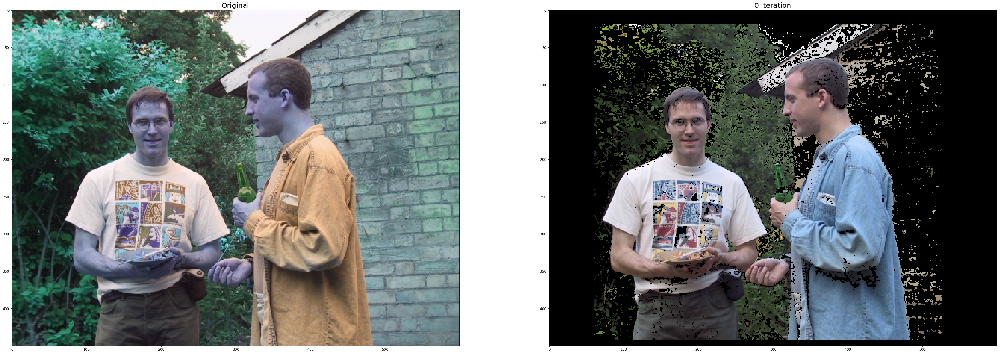

exiting grabcut...


In [111]:
#GMM=11
if __name__ == '__main__':
    filename = '../images/person4.jpg'               # Path to image file
    ITR=1
    run(filename,ITR)
    cv2.destroyAllWindows()

in grabcut...
[53, 28, 500, 410]
in calculateMask...
Exiting calculateMask...
value of gmm :  11


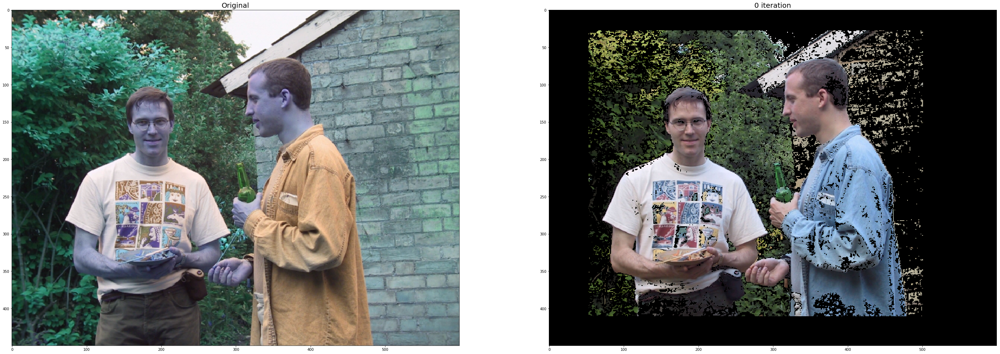

exiting grabcut...


In [115]:
#GMM=31
if __name__ == '__main__':
    filename = '../images/person4.jpg'               # Path to image file
    ITR=1
    run(filename,ITR)
    cv2.destroyAllWindows()

in grabcut...
[50, 48, 419, 362]
in calculateMask...
Exiting calculateMask...
value of gamma :  0.5


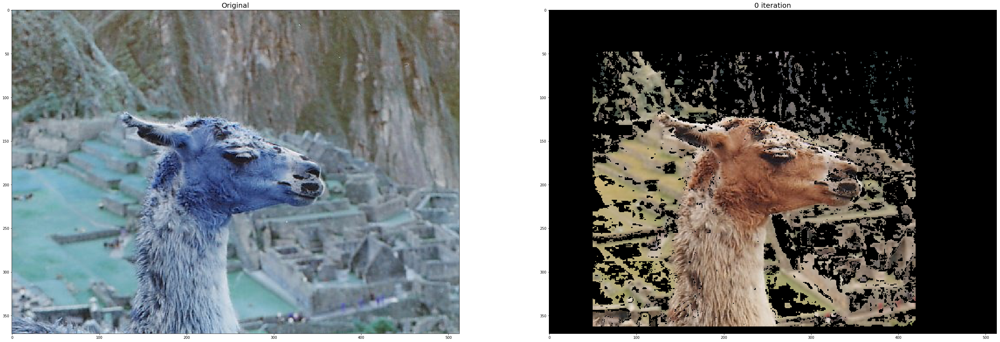

exiting grabcut...


In [6]:
#3.Verifcation for different value of gamma
#gamma=.5
if __name__ == '__main__':
    filename = '../images/llama.jpg'               # Path to image file
    ITR=1
    run(filename,ITR)
    cv2.destroyAllWindows()

in grabcut...
[39, 28, 385, 351]
in calculateMask...
Exiting calculateMask...
value of gamma :  1


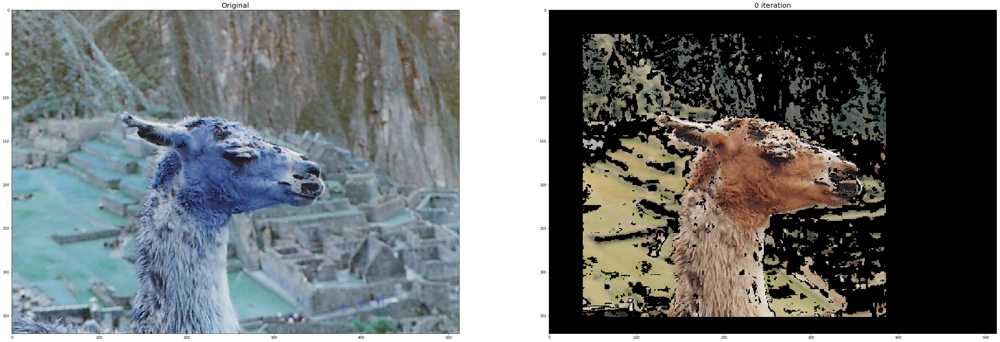

exiting grabcut...


In [15]:
#3.Verifcation for different value of gamma
#gamma=1
if __name__ == '__main__':
    filename = '../images/llama.jpg'               # Path to image file
    ITR=1
    run(filename,ITR)
    cv2.destroyAllWindows()

in grabcut...
[39, 32, 405, 362]
in calculateMask...
Exiting calculateMask...
value of gamma :  50


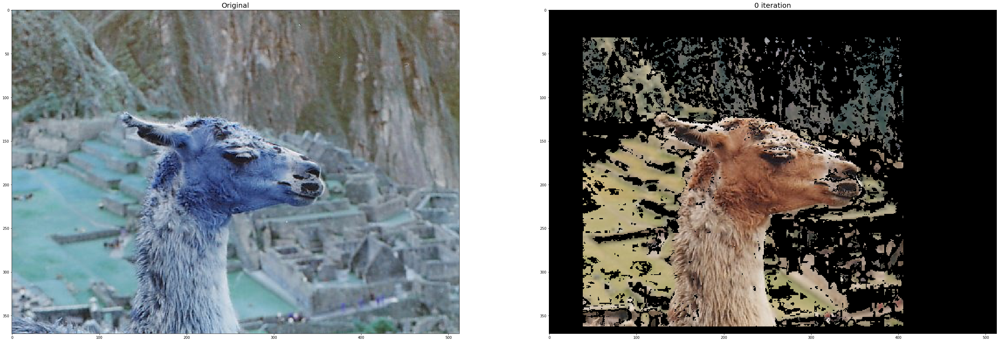

exiting grabcut...


In [12]:
#3.Verifcation for different value of gamma
#gamma=50
if __name__ == '__main__':
    filename = '../images/llama.jpg'               # Path to image file
    ITR=1
    run(filename,ITR)
    cv2.destroyAllWindows()

in grabcut...
[35, 33, 395, 353]
in calculateMask...
Exiting calculateMask...
value of gamma :  100


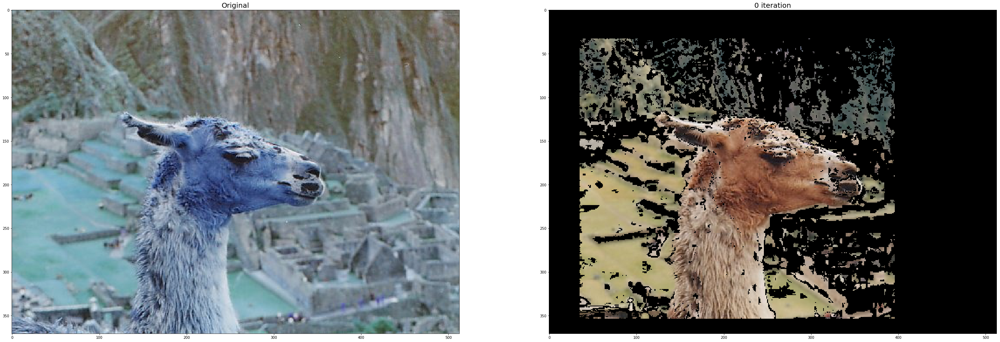

exiting grabcut...


In [20]:
#3.Verifcation for different value of gamma
#gamma=100
if __name__ == '__main__':
    filename = '../images/llama.jpg'               # Path to image file
    ITR=1
    run(filename,ITR)
    cv2.destroyAllWindows()

in grabcut...
[32, 34, 409, 359]
in calculateMask...
Exiting calculateMask...
value of gamma :  1000


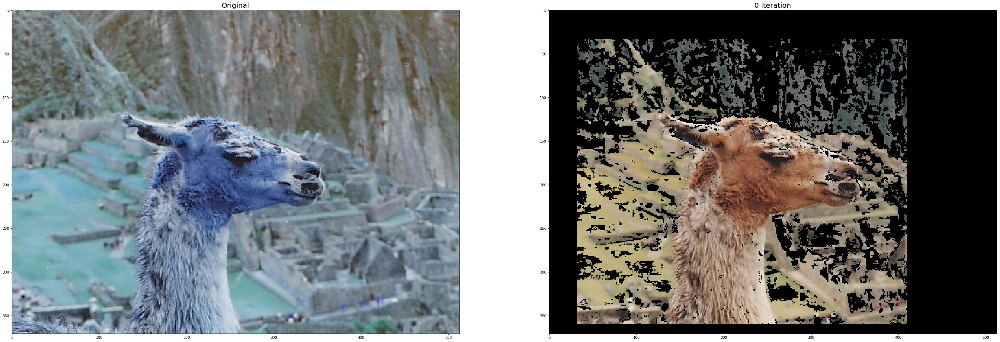

exiting grabcut...


In [18]:
#3.Verifcation for different value of gamma
#gamma=1000
if __name__ == '__main__':
    filename = '../images/llama.jpg'               # Path to image file
    ITR=1
    run(filename,ITR)
    cv2.destroyAllWindows()